In [1]:
from __future__ import print_function

import kornia
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
imsize = 512 if torch.cuda.is_available() else 1080

loader = transforms.Compose([
    transforms.Resize(imsize),
    transforms.ToTensor()])

def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

style_img = image_loader('./images/polygon2.jpg')
content_img = image_loader('./images/tahoe2.jpg')

print(style_img.size())
print(content_img.size())

assert style_img.size() == content_img.size(), 'We need content and style images of the same size'

torch.Size([1, 3, 1080, 1920])
torch.Size([1, 3, 1080, 1920])


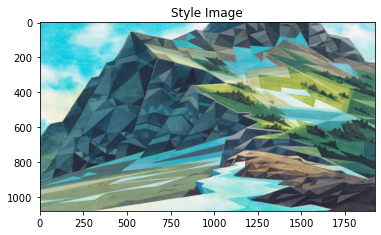

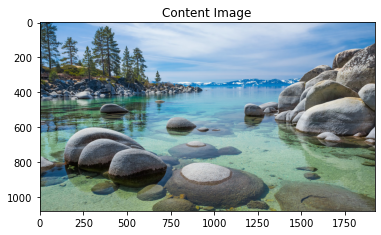

In [4]:
unloader = transforms.ToPILImage()

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)
    
plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

In [5]:
class ContentLoss(nn.Module):
    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()
        
    def forward(self, input):
        self.loss = F.l1_loss(input, self.target)
        #print('Con:', type(self.loss))
        return input

In [6]:
def gram_matrix(input):
    a, b, c, d = input.size() 
    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

In [7]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()
        
    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.l1_loss(G, self.target)
        #print('Sty: ', type(self.loss))
        return input

In [8]:
#cnn = models.vgg19(pretrained=True).features.to(device).eval()
cnn = models.vgg19(pretrained=True).features.eval()

C:\ProgramData\Anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [9]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)
        
    def forward(self, img):
        return (img - self.mean) / self.std

In [10]:
content_layers_default = ['relu4_2']
style_layers_default = ['relu1_1', 'relu2_1', 'relu3_1', 'relu4_1', 'relu5_1']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                              style_img, content_img, input_img,
                              content_layers=content_layers_default,
                              style_layers=style_layers_default):
    
    normalization = Normalization(normalization_mean, normalization_std).to(device)
    

    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    block, number = 1, 1
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            name = f'conv{block}_{number}'
        elif isinstance(layer, nn.ReLU):
            name = f'relu{block}_{number}'
            layer = nn.ReLU(inplace=False)
            number += 1
        elif isinstance(layer, nn.MaxPool2d):
            name = f'pool_{block}'
            layer = nn.AvgPool2d(layer.kernel_size, layer.stride)
            block += 1
            number = 1
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)
        
        if name in content_layers:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module(f'{name}_ContentLoss', content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module(f'{name}_ContentLoss', style_loss)
            style_losses.append(style_loss)
            
    
    for i in range(len(model) -1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break
        

    model = model[:(i + 1)]

    return model, style_losses, content_losses

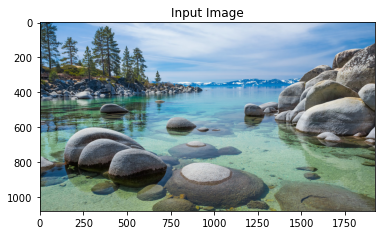

In [11]:
input_img = content_img.clone()
#white noise option
#input_img = torch.randn(content_img.data.size(), device=device)

plt.figure()
imshow(input_img, title='Input Image')

In [12]:
def get_input_optimizer(input_img):
    optimizer = optim.Adam([input_img.requires_grad_()], lr=0.05)
    return optimizer

In [13]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=200,
                      style_weight=1e4, content_weight=100, regularization_weight=1e-6):

    print('Building the style transfer model...')
    model, style_losses, content_losses = get_style_model_and_losses(cnn, normalization_mean,
                                                                    normalization_std,
                                                                    style_img, content_img, input_img)
    
    input_img.requires_grad_(True)
    model.requires_grad_(False)
    
    optimizer = get_input_optimizer(input_img)
    
    #transformations
    n, c, h, w = content_img.data.size()
    transform = nn.Sequential(
        kornia.augmentation.RandomResizedCrop(
            size=(h, w), scale=(.97, 1.), ratio=(.97, 1.03)),
        kornia.augmentation.RandomRotation(degrees=1.))
    
    print('Optimizing...')
    run = [0]
    while run[0] <= num_steps:
        def closure():
            with torch.no_grad():
                input_img.clamp_(0, 1)
                
            optimizer.zero_grad()
            
            if h == w:
                model(transform(input_img))
            else:
                model(input_img)
            
            style_score = 0
            content_score = 0
            
            for sl in style_losses:
                style_score += sl.loss

            for cl in content_losses:
                content_score += cl.loss
            
            style_score *= style_weight
            content_score *= content_weight
            
            reg_score = regularization_weight * (
                torch.sum(torch.pow(input_img[:,:,:,:-1] - input_img[:,:,:,1:], 2))
                + torch.sum(torch.pow(input_img[:,:,:-1,:] - input_img[:,:,1:,:], 2))
            )
                
            
            loss = style_score + content_score + reg_score
            loss.backward()
            
            run[0] += 1
            if run[0] % 10 == 0:
                print('run {}:'.format(run))
                print('Style Loss : {:4f} Content Loss: {:4f} Variation Loss: {:4f}'.format(
                    style_score.item(), content_score.item(), reg_score.item()))
                print()
                
                plt.figure(figsize=(12, 12))
                imshow(input_img)
                plt.show()
                
            return style_score + content_score + reg_score
        
        optimizer.step(closure)
    with torch.no_grad():
        input_img.clamp_(0, 1)
        
    return input_img

Building the style transfer model...


<ipython-input-9-49954a50ab18>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
<ipython-input-9-49954a50ab18>:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)


Optimizing...
run [10]:
Style Loss : 159.318146 Content Loss: 17.462543 Variation Loss: 0.047052



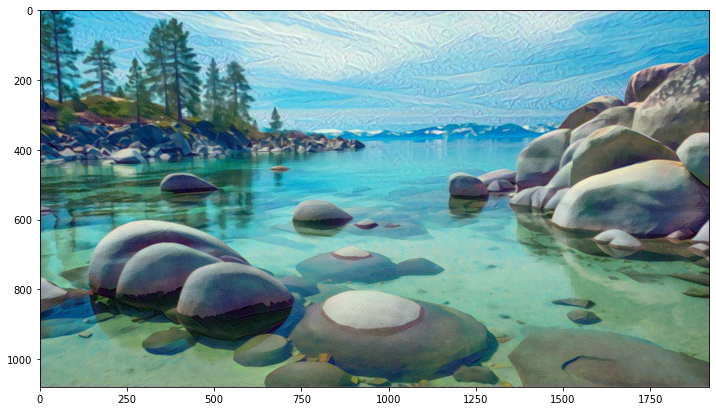

run [20]:
Style Loss : 111.039673 Content Loss: 17.307167 Variation Loss: 0.041758



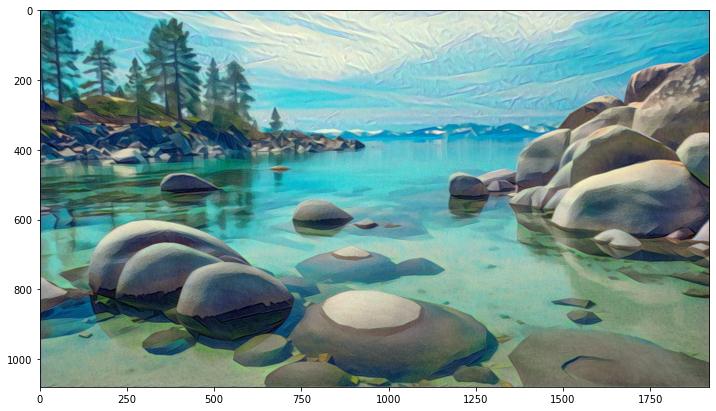

run [30]:
Style Loss : 90.045555 Content Loss: 16.623245 Variation Loss: 0.039154



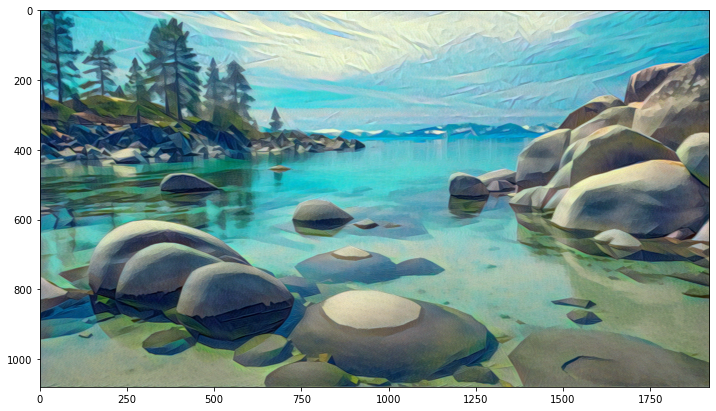

run [40]:
Style Loss : 68.453033 Content Loss: 16.374102 Variation Loss: 0.037197



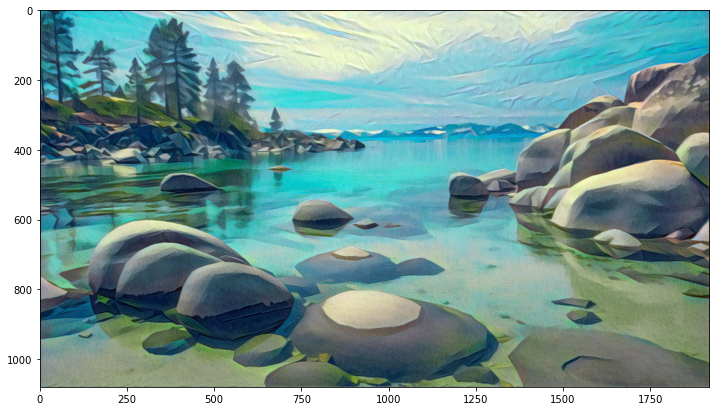

run [50]:
Style Loss : 82.956421 Content Loss: 16.266224 Variation Loss: 0.035678



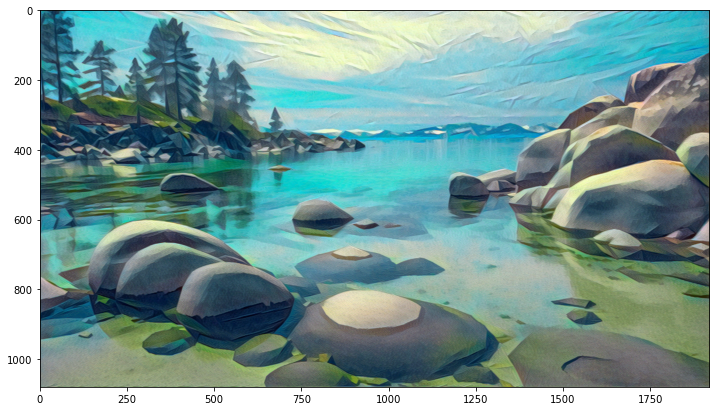

run [60]:
Style Loss : 59.218071 Content Loss: 16.059233 Variation Loss: 0.034197



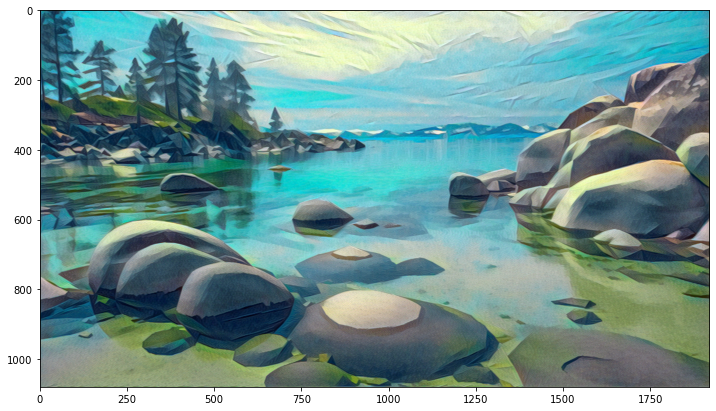

run [70]:
Style Loss : 94.233200 Content Loss: 16.488235 Variation Loss: 0.033415



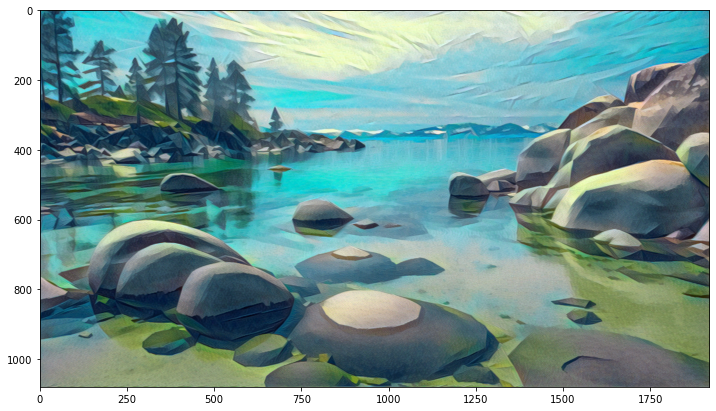

run [80]:
Style Loss : 47.808434 Content Loss: 15.817934 Variation Loss: 0.032880



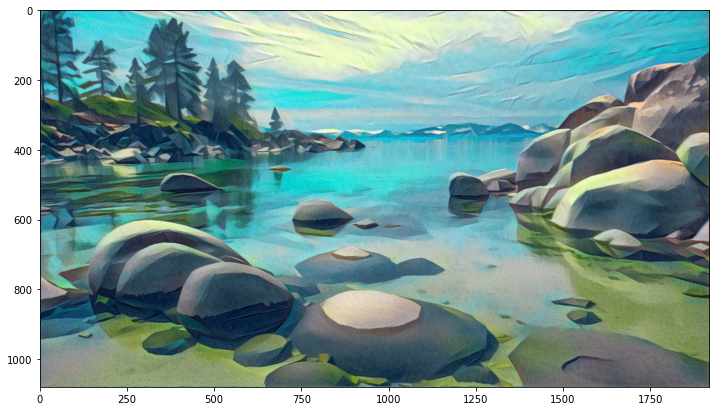

run [90]:
Style Loss : 43.507504 Content Loss: 15.697145 Variation Loss: 0.032182



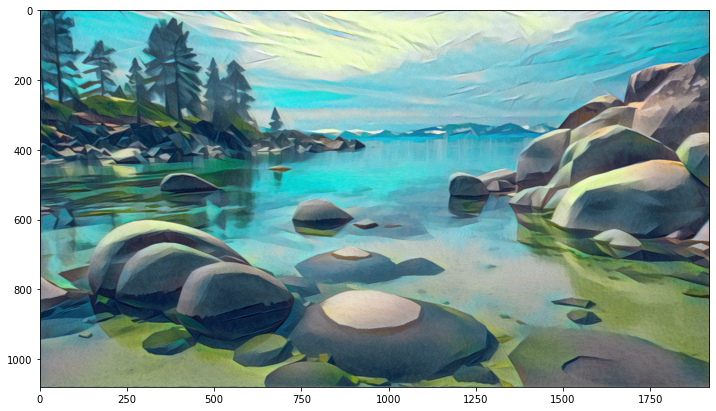

run [100]:
Style Loss : 50.776207 Content Loss: 15.856904 Variation Loss: 0.032196



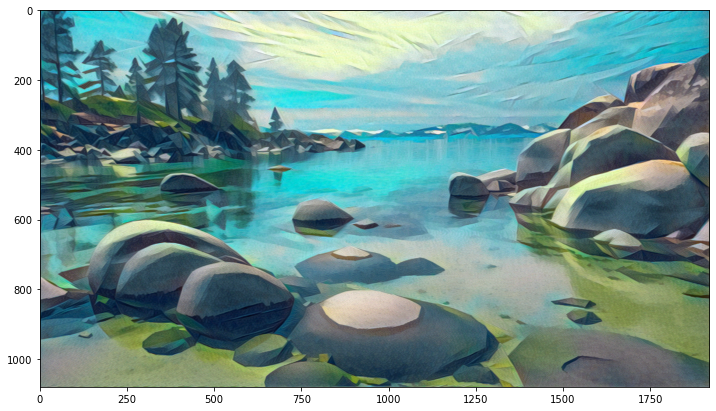

run [110]:
Style Loss : 47.715439 Content Loss: 15.603113 Variation Loss: 0.031576



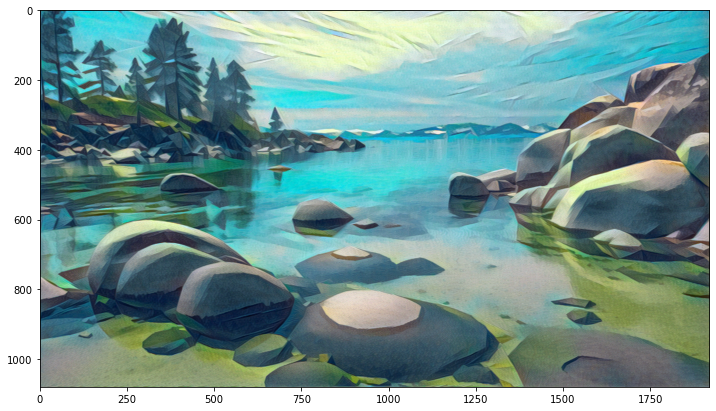

run [120]:
Style Loss : 59.244339 Content Loss: 15.814071 Variation Loss: 0.031387



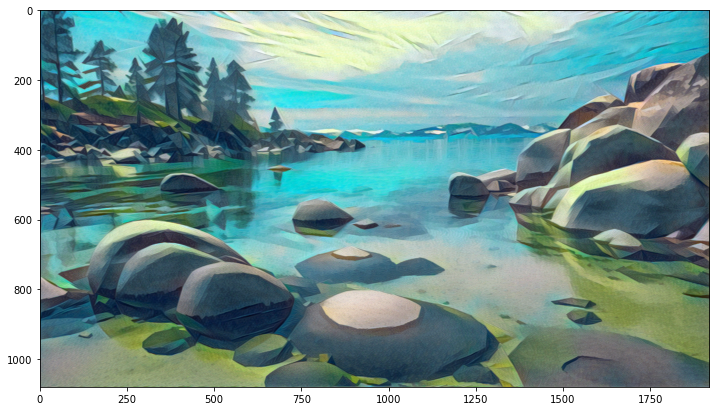

run [130]:
Style Loss : 41.331261 Content Loss: 15.782920 Variation Loss: 0.031121



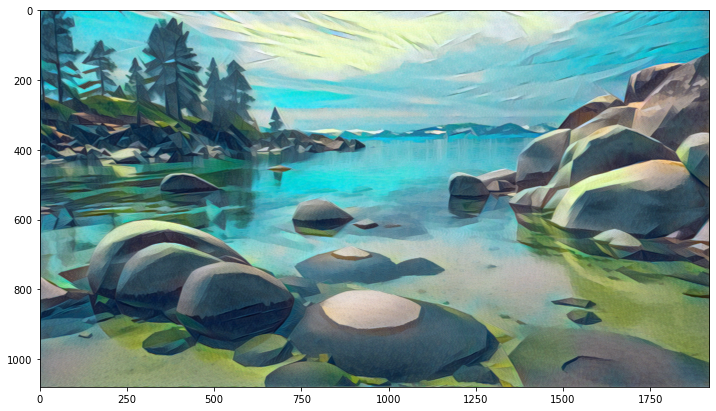

run [140]:
Style Loss : 57.953266 Content Loss: 15.815481 Variation Loss: 0.031666



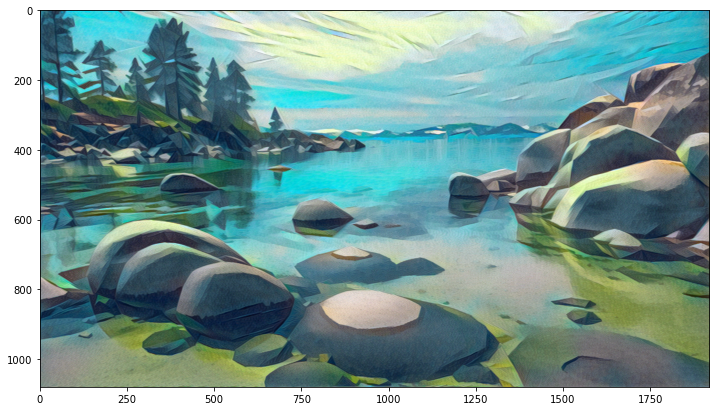

run [150]:
Style Loss : 41.750816 Content Loss: 15.693122 Variation Loss: 0.030816



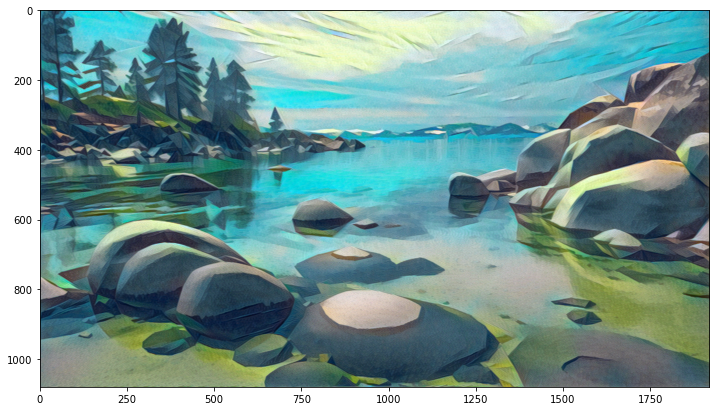

run [160]:
Style Loss : 48.965546 Content Loss: 15.587844 Variation Loss: 0.031206



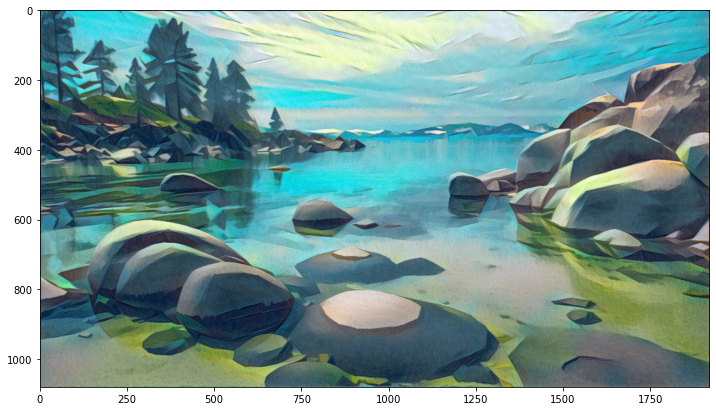

run [170]:
Style Loss : 43.174007 Content Loss: 15.443340 Variation Loss: 0.030939



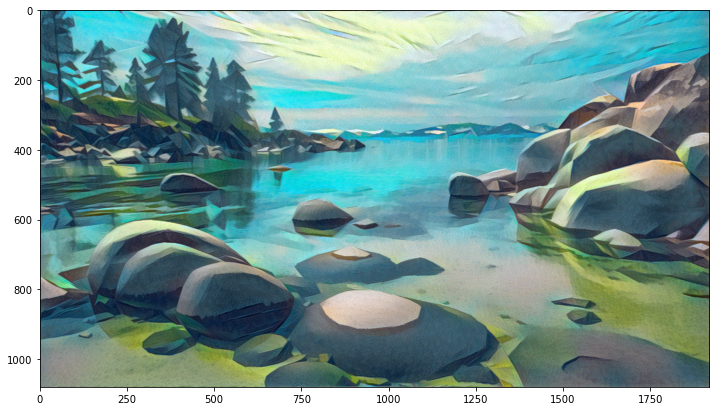

run [180]:
Style Loss : 96.095299 Content Loss: 15.744555 Variation Loss: 0.031474



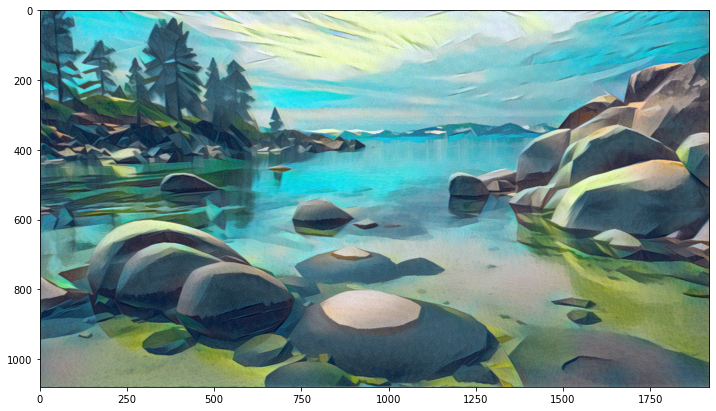

run [190]:
Style Loss : 51.378185 Content Loss: 15.327278 Variation Loss: 0.030368



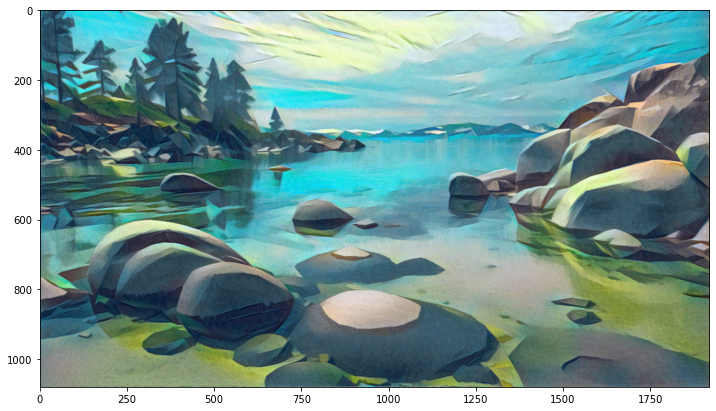

run [200]:
Style Loss : 53.973984 Content Loss: 15.478995 Variation Loss: 0.031199



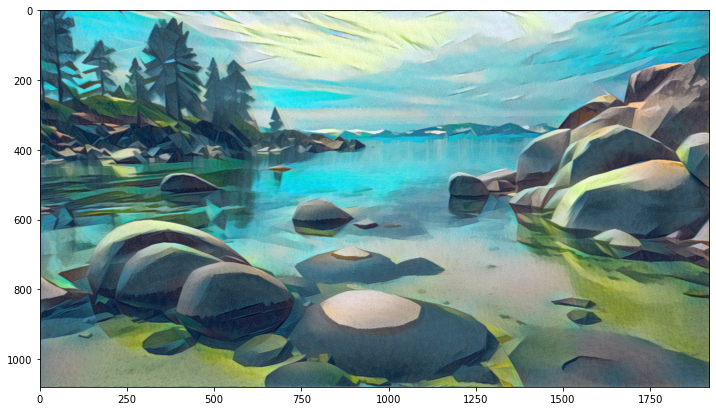

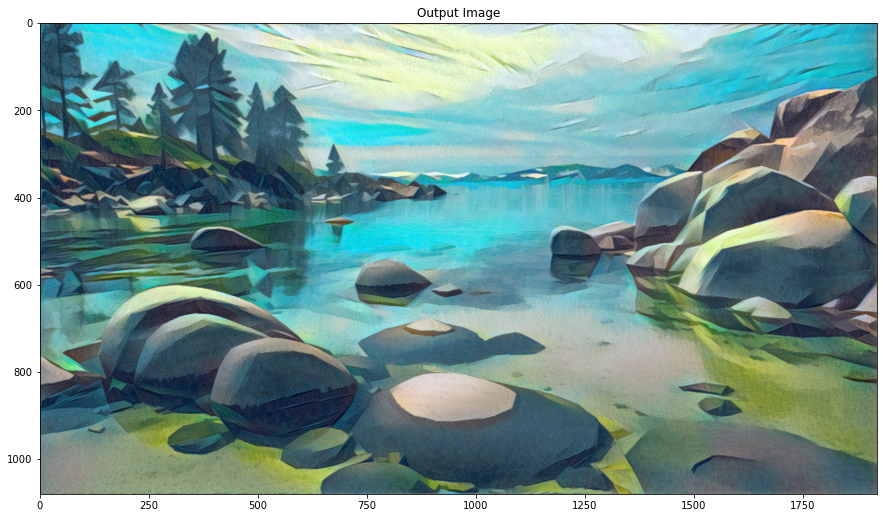

In [14]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       content_img, style_img, input_img, num_steps=200,
                      style_weight=2e5, content_weight=1e2, regularization_weight=1e-6)

plt.figure(figsize=(15, 15))
imshow(output, title='Output Image')

plt.ioff()
plt.show()

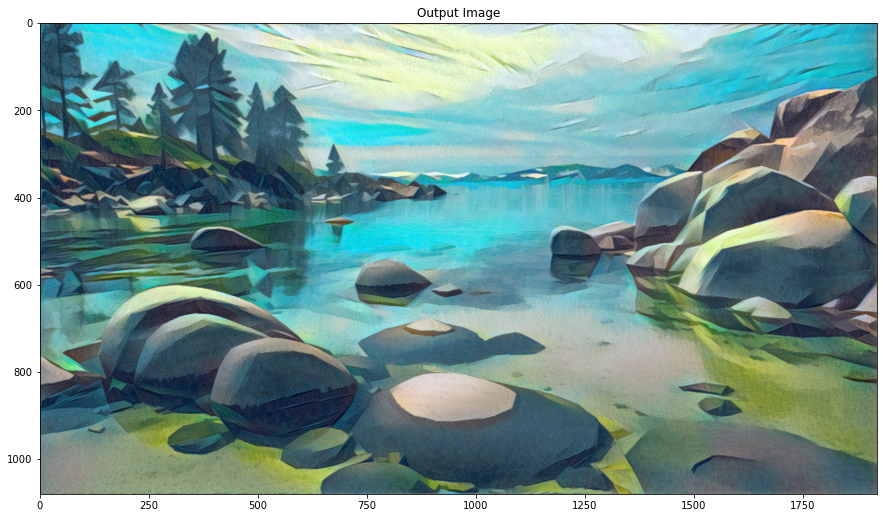

In [15]:
plt.figure(figsize=(15, 15))
imshow(output, title='Output Image')

plt.ioff()
plt.show()

In [19]:
output_image = output.cpu().clone()
output_image = output_image.squeeze(0)
output_image = unloader(output_image)
type(output_image)
output_image = output_image.save('geometric_tahoe.jpg')